# Ch08 - A2C 同步 Actor-Critic

策略 + 价值协同工作，单步更新 + 小方差。

> 本 Notebook 配套《强化学习全面教程》PDF 使用。包含图形讲解单元。

In [5]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import gymnasium as gym
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Rectangle, Circle
import random
from collections import deque, defaultdict

# 中文字体配置
import os, platform
if platform.system() == 'Linux' and os.path.exists('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf'):
    fm.fontManager.addfont('/usr/share/fonts/truetype/chinese/NotoSansSC-Regular.ttf')
plt.rcParams['font.sans-serif'] = ['Noto Sans SC', 'DejaVu Sans', 'Arial Unicode MS']
plt.rcParams['axes.unicode_minus'] = False

COLORS = {
    'primary': '#887129', 'accent': '#50abc9', 'success': '#3a794f',
    'warning': '#94773b', 'error': '#a2524b', 'info': '#547da6',
    'muted': '#89867f', 'bg': '#f7f7f6', 'card': '#eeece9',
    'border': '#dad5c6', 'text': '#1f1e1c',
}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'PyTorch: {torch.__version__} | 设备: {device} | Gymnasium: {gym.__version__}')


PyTorch: 2.13.0+cpu | 设备: cpu | Gymnasium: 1.3.0


## 8.1 Actor-Critic 框架

**Actor**（策略）+ **Critic**（价值）协同：
- Actor 用 Critic 估计的优势更新策略
- Critic 用 TD 误差更新价值

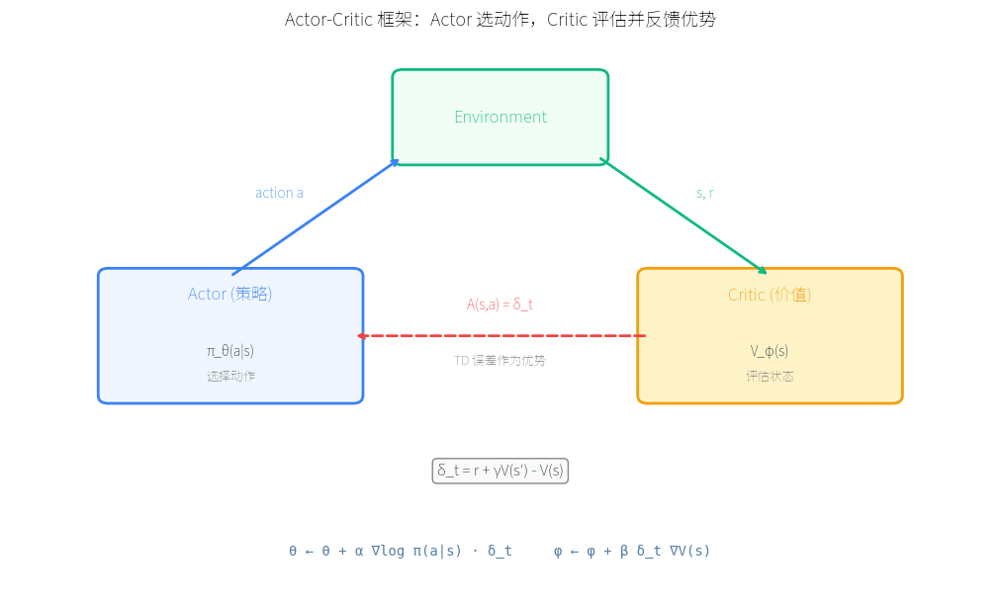

In [6]:
# 图形讲解：Actor-Critic 框架
fig, ax = plt.subplots(figsize=(10, 6), constrained_layout=True)
ax.set_xlim(0, 10); ax.set_ylim(0, 7); ax.axis('off')

# 环境
ax.add_patch(FancyBboxPatch((4, 5.5), 2, 1, boxstyle='round,pad=0.1',
    facecolor='#F0FDF4', edgecolor='#10B981', linewidth=2))
ax.text(5, 6, 'Environment', ha='center', va='center', fontsize=12, fontweight='bold', color='#10B981')

# Actor
ax.add_patch(FancyBboxPatch((1, 2.5), 2.5, 1.5, boxstyle='round,pad=0.1',
    facecolor='#EFF6FF', edgecolor='#3B82F6', linewidth=2))
ax.text(2.25, 3.7, 'Actor (策略)', ha='center', fontsize=12, fontweight='bold', color='#3B82F6')
ax.text(2.25, 3.0, 'π_θ(a|s)', ha='center', fontsize=10, color='#1F2937')
ax.text(2.25, 2.7, '选择动作', ha='center', fontsize=9, color=COLORS['muted'])

# Critic
ax.add_patch(FancyBboxPatch((6.5, 2.5), 2.5, 1.5, boxstyle='round,pad=0.1',
    facecolor='#FEF3C7', edgecolor='#F59E0B', linewidth=2))
ax.text(7.75, 3.7, 'Critic (价值)', ha='center', fontsize=12, fontweight='bold', color='#F59E0B')
ax.text(7.75, 3.0, 'V_φ(s)', ha='center', fontsize=10, color='#1F2937')
ax.text(7.75, 2.7, '评估状态', ha='center', fontsize=9, color=COLORS['muted'])

# 箭头：Actor -> Env (action)
ax.annotate('', xy=(4, 5.5), xytext=(2.25, 4),
    arrowprops=dict(arrowstyle='->', color='#3B82F6', lw=2))
ax.text(2.5, 5, 'action a', fontsize=10, color='#3B82F6', fontweight='bold')

# 箭头：Env -> Critic (s, r)
ax.annotate('', xy=(7.75, 4), xytext=(6, 5.5),
    arrowprops=dict(arrowstyle='->', color='#10B981', lw=2))
ax.text(7, 5, 's, r', fontsize=10, color='#10B981', fontweight='bold')

# 箭头：Critic -> Actor (advantage)
ax.annotate('', xy=(3.5, 3.25), xytext=(6.5, 3.25),
    arrowprops=dict(arrowstyle='->', color='#EF4444', lw=2, linestyle='dashed'))
ax.text(5, 3.6, 'A(s,a) = δ_t', fontsize=10, color='#EF4444', fontweight='bold', ha='center')
ax.text(5, 2.9, 'TD 误差作为优势', fontsize=9, color=COLORS['muted'], ha='center')

# 公式
ax.text(5, 1.5, 'δ_t = r + γV(s\') - V(s)',
        ha='center', fontsize=11, color=COLORS['text'],
        bbox=dict(boxstyle='round,pad=0.3', facecolor='#F8FAFC', edgecolor=COLORS['muted']))
ax.text(5, 0.5, 'θ ← θ + α ∇log π(a|s) · δ_t     φ ← φ + β δ_t ∇V(s)',
        ha='center', fontsize=10, color=COLORS['info'], family='monospace')

ax.set_title('Actor-Critic 框架：Actor 选动作，Critic 评估并反馈优势', fontsize=13, fontweight='bold', pad=10)
plt.show()

## 8.2 GAE：广义优势估计

GAE 在单步 TD（方差小但有偏差）与 MC（无偏但方差大）之间指数加权：
$$A^{GAE}_t = \sum_{k=0}^{\infty} (\gamma\lambda)^k \delta_{t+k}$$

λ=0 退化为单步 TD，λ=1 退化为 MC。实践中 λ=0.95 是黄金值。

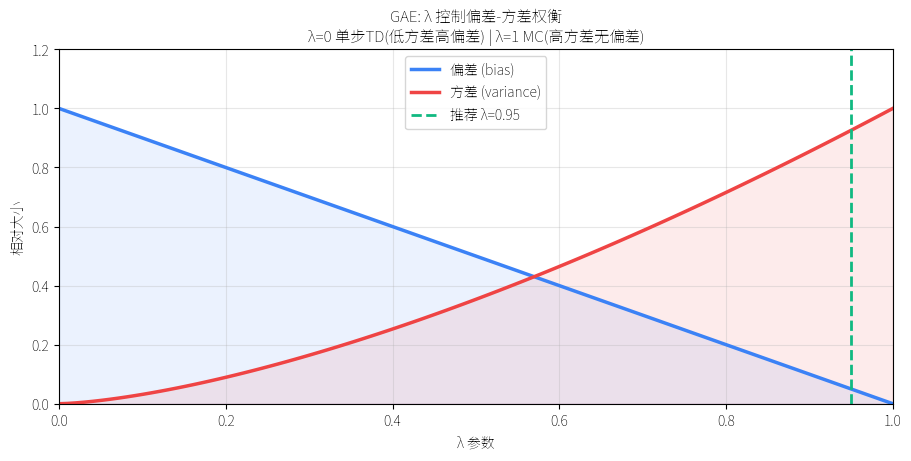

In [7]:
# 图形讲解：GAE λ 参数对偏差-方差的影响
fig, ax = plt.subplots(figsize=(9, 4.5), constrained_layout=True)
lambdas = np.linspace(0, 1, 100)
bias = 1 - lambdas  # λ=0 时偏差最大
variance = lambdas ** 1.5  # λ=1 时方差最大
ax.plot(lambdas, bias, color='#3B82F6', linewidth=2.5, label='偏差 (bias)')
ax.plot(lambdas, variance, color='#EF4444', linewidth=2.5, label='方差 (variance)')
ax.axvline(x=0.95, color='#10B981', linestyle='--', linewidth=2, label='推荐 λ=0.95')
ax.fill_between(lambdas, 0, bias, alpha=0.1, color='#3B82F6')
ax.fill_between(lambdas, 0, variance, alpha=0.1, color='#EF4444')
ax.set_xlabel('λ 参数'); ax.set_ylabel('相对大小')
ax.set_title('GAE: λ 控制偏差-方差权衡\nλ=0 单步TD(低方差高偏差) | λ=1 MC(高方差无偏差)',
             fontsize=11, fontweight='bold')
ax.legend(loc='upper center'); ax.grid(alpha=0.3)
ax.set_xlim(0, 1); ax.set_ylim(0, 1.2)
plt.show()

## 8.3 A2C 实现

In [8]:
from torch.distributions import Categorical

class PolicyNetwork(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
        )
        self.head = nn.Linear(hidden, action_dim)
    def forward(self, x): return self.head(self.net(x))


class ValueNetwork(nn.Module):
    def __init__(self, state_dim, hidden=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
            nn.Linear(hidden, 1),
        )
    def forward(self, x): return self.net(x).squeeze(-1)


class A2CAgent:
    def __init__(self, state_dim, action_dim, lr=5e-4, gamma=0.99,
                 rollout_steps=5, entropy_coef=0.01):
        self.device = device; self.gamma = gamma
        self.rollout_steps = rollout_steps; self.entropy_coef = entropy_coef
        self.actor = PolicyNetwork(state_dim, action_dim).to(device)
        self.critic = ValueNetwork(state_dim).to(device)
        self.optimizer = optim.Adam(
            list(self.actor.parameters()) + list(self.critic.parameters()), lr=lr)

    def select_action(self, state):
        s = torch.as_tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
        logits = self.actor(s)
        dist = Categorical(logits=logits)
        a = dist.sample()
        return a.item(), dist.log_prob(a), dist.entropy(), self.critic(s)

    def update(self, rollout):
        if not rollout:
            return
        log_probs, entropies, values, rewards, next_vals, dones = zip(*rollout)
        log_probs = torch.stack(log_probs).view(-1)
        entropies = torch.stack(entropies).view(-1)
        values = torch.stack(values).view(-1)
        next_vals = torch.stack(next_vals).view(-1)
        dones = torch.tensor(dones, dtype=torch.float32, device=device).view(-1)
        returns = []
        R = next_vals[-1] * (1 - dones[-1])
        for i in reversed(range(len(rewards))):
            R = rewards[i] + self.gamma * (1 - dones[i]) * R
            returns.insert(0, R)
        returns = torch.stack(returns)
        advantages = (returns - values).detach()
        if advantages.numel() > 1:
            advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
        actor_loss = -(log_probs * advantages).mean()
        critic_loss = nn.functional.mse_loss(values, returns)
        entropy_loss = -entropies.mean()
        total = actor_loss + 0.5 * critic_loss + self.entropy_coef * entropy_loss
        self.optimizer.zero_grad(); total.backward()
        nn.utils.clip_grad_norm_(self.actor.parameters(), 5.0)
        nn.utils.clip_grad_norm_(self.critic.parameters(), 5.0)
        self.optimizer.step()

env = gym.make('CartPole-v1')
agent = A2CAgent(env.observation_space.shape[0], env.action_space.n)
print('A2C Agent 创建完成 ✓')

A2C Agent 创建完成 ✓


## 8.4 训练循环

In [9]:
# Stable synchronous A2C: multiple environments + normalized observations + GAE.
from torch.distributions import Categorical
import torch.optim as optim

def normalize_cartpole(obs):
    scale = np.asarray([2.4, 3.0, 0.21, 3.5], dtype=np.float32)
    return np.clip(np.asarray(obs, dtype=np.float32) / scale, -5.0, 5.0)

class ParallelActorCritic(nn.Module):
    def __init__(self, state_dim, action_dim, hidden=128):
        super().__init__()
        self.body = nn.Sequential(
            nn.Linear(state_dim, hidden), nn.Tanh(),
            nn.Linear(hidden, hidden), nn.Tanh(),
        )
        self.policy_head = nn.Linear(hidden, action_dim)
        self.value_head = nn.Linear(hidden, 1)

    def forward(self, x):
        h = self.body(x)
        return self.policy_head(h), self.value_head(h).squeeze(-1)

class ParallelA2CAgent:
    def __init__(self, state_dim, action_dim, lr=7e-4, gamma=0.99,
                 gae_lambda=0.95, entropy_coef=0.005, value_coef=0.5):
        self.gamma = gamma
        self.gae_lambda = gae_lambda
        self.entropy_coef = entropy_coef
        self.value_coef = value_coef
        self.net = ParallelActorCritic(state_dim, action_dim).to(device)
        self.optimizer = optim.Adam(self.net.parameters(), lr=lr, eps=1e-5)

    def act(self, obs):
        x = torch.as_tensor(normalize_cartpole(obs), dtype=torch.float32, device=device)
        with torch.no_grad():
            logits, values = self.net(x)
            dist = Categorical(logits=logits)
            actions = dist.sample()
            log_probs = dist.log_prob(actions)
            entropy = dist.entropy()
        return (actions.cpu().numpy(), log_probs.cpu().numpy(), entropy.cpu().numpy(), values.cpu().numpy())

    def value(self, obs):
        x = torch.as_tensor(normalize_cartpole(obs), dtype=torch.float32, device=device)
        with torch.no_grad():
            _, values = self.net(x)
        return values.cpu().numpy()

    def greedy_action(self, obs):
        x = torch.as_tensor(normalize_cartpole(obs), dtype=torch.float32, device=device).unsqueeze(0)
        with torch.no_grad():
            logits, _ = self.net(x)
        return int(logits.argmax(dim=-1).item())

    def update(self, batch):
        states, actions, old_log_probs, entropies, values, rewards, next_values, dones = batch
        states = np.asarray(states, dtype=np.float32)
        actions = np.asarray(actions, dtype=np.int64)
        old_log_probs = np.asarray(old_log_probs, dtype=np.float32)
        values = np.asarray(values, dtype=np.float32)
        rewards = np.asarray(rewards, dtype=np.float32)
        next_values = np.asarray(next_values, dtype=np.float32)
        dones = np.asarray(dones, dtype=np.float32)
        advantages = np.zeros_like(rewards, dtype=np.float32)
        gae = np.zeros(rewards.shape[1], dtype=np.float32)
        for t in reversed(range(rewards.shape[0])):
            delta = rewards[t] + self.gamma * (1.0 - dones[t]) * next_values[t] - values[t]
            gae = delta + self.gamma * self.gae_lambda * (1.0 - dones[t]) * gae
            advantages[t] = gae
        returns = advantages + values
        flat_states = states.reshape(-1, states.shape[-1])
        state_t = torch.as_tensor(normalize_cartpole(flat_states), dtype=torch.float32, device=device)
        action_t = torch.as_tensor(actions.reshape(-1), dtype=torch.int64, device=device)
        return_t = torch.as_tensor(returns.reshape(-1), dtype=torch.float32, device=device)
        adv_t = torch.as_tensor(advantages.reshape(-1), dtype=torch.float32, device=device)
        adv_t = (adv_t - adv_t.mean()) / (adv_t.std() + 1e-8)
        logits, value_pred = self.net(state_t)
        dist = Categorical(logits=logits)
        log_t = dist.log_prob(action_t)
        actor_loss = -(log_t * adv_t.detach()).mean()
        critic_loss = nn.functional.mse_loss(value_pred, return_t)
        entropy_loss = -dist.entropy().mean()
        loss = actor_loss + self.value_coef * critic_loss + self.entropy_coef * entropy_loss
        self.optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(self.net.parameters(), 0.5)
        self.optimizer.step()

def make_cartpole():
    return gym.make('CartPole-v1')

def train_parallel_a2c(updates=500, n_envs=8, rollout_steps=32, seed=42):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
    vec_env = gym.vector.SyncVectorEnv([make_cartpole for _ in range(n_envs)])
    obs, _ = vec_env.reset(seed=seed)
    agent = ParallelA2CAgent(vec_env.single_observation_space.shape[0], vec_env.single_action_space.n)
    episode_returns = np.zeros(n_envs, dtype=np.float32)
    completed = []
    for update_idx in range(updates):
        batch = [[] for _ in range(8)]
        for _ in range(rollout_steps):
            actions, log_probs, entropy, values = agent.act(obs)
            next_obs, rewards_step, terminated, truncated, _ = vec_env.step(actions)
            done = np.logical_or(terminated, truncated)
            next_values = agent.value(next_obs)
            for container, item in zip(batch, (obs, actions, log_probs, entropy, values, rewards_step, next_values, done)):
                container.append(item)
            episode_returns += rewards_step
            for i, is_done in enumerate(done):
                if is_done:
                    completed.append(float(episode_returns[i]))
                    episode_returns[i] = 0.0
            obs = next_obs
        agent.update(batch)
        if (update_idx + 1) % 20 == 0:
            recent = completed[-20:] if completed else [float(np.mean(batch[5]))]
            print(f'update {update_idx + 1:3d} | episodes={len(completed):4d} | avg20={np.mean(recent):6.1f}')
    vec_env.close()
    return agent, completed

def evaluate_greedy(agent, episodes=20, seed=10_000):
    eval_env = gym.make('CartPole-v1')
    scores = []
    for ep in range(episodes):
        obs, _ = eval_env.reset(seed=seed + ep)
        total = 0.0
        for _ in range(500):
            action = agent.greedy_action(obs)
            obs, reward, terminated, truncated, _ = eval_env.step(action)
            total += reward
            if terminated or truncated:
                break
        scores.append(total)
    eval_env.close()
    return scores

agent, rewards = train_parallel_a2c(updates=500, n_envs=8, rollout_steps=32, seed=42)
eval_rewards = evaluate_greedy(agent)
print(f'greedy evaluation: mean={np.mean(eval_rewards):.1f}, max={np.max(eval_rewards):.1f}')

update  20 | episodes= 219 | avg20=  27.4
update  40 | episodes= 428 | avg20=  22.2
update  60 | episodes= 636 | avg20=  22.7
update  80 | episodes= 854 | avg20=  27.6
update 100 | episodes=1083 | avg20=  18.5
update 120 | episodes=1294 | avg20=  28.1
update 140 | episodes=1488 | avg20=  20.3
update 160 | episodes=1649 | avg20=  43.5
update 180 | episodes=1797 | avg20=  32.7
update 200 | episodes=1926 | avg20=  52.1
update 220 | episodes=2034 | avg20=  40.2
update 240 | episodes=2133 | avg20=  52.0
update 260 | episodes=2233 | avg20=  42.0
update 280 | episodes=2314 | avg20=  85.8
update 300 | episodes=2396 | avg20=  55.0
update 320 | episodes=2467 | avg20=  76.0
update 340 | episodes=2526 | avg20=  77.3
update 360 | episodes=2601 | avg20=  56.6
update 380 | episodes=2653 | avg20=  84.5
update 400 | episodes=2706 | avg20=  91.5
update 420 | episodes=2765 | avg20=  83.9
update 440 | episodes=2827 | avg20=  84.2
update 460 | episodes=2871 | avg20= 133.3
update 480 | episodes=2936 | avg20

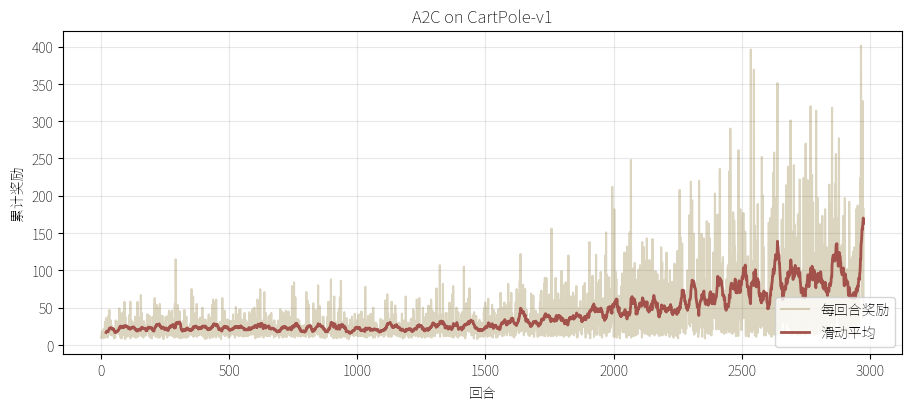

In [10]:
# 图形讲解：A2C 训练曲线
fig, ax = plt.subplots(figsize=(9, 4), constrained_layout=True)
ax.plot(rewards, alpha=0.3, color=COLORS['primary'], label='每回合奖励')
if len(rewards) >= 20:
    ma = np.convolve(rewards, np.ones(20)/20, mode='valid')
    ax.plot(range(19, len(rewards)), ma, color=COLORS['error'], linewidth=2, label='滑动平均')
ax.set_xlabel('回合'); ax.set_ylabel('累计奖励')
ax.set_title('A2C on CartPole-v1', fontsize=12, fontweight='bold')
ax.legend(loc='lower right'); ax.grid(alpha=0.3)
plt.show()

## 8.5 可视化训练效果

用训练好的策略跑一回合 CartPole，动画展示小车平衡杆的控制效果。

In [12]:
from viz_utils import visualize_cartpole
visualize_cartpole(lambda s: agent.greedy_action(s), title='A2C 策略可视化')

## 8.6 小结

A2C 相比 REINFORCE：在线学习、方差更小、加熵正则防过早收敛

下一章：**PPO**——解决 A2C 样本效率低的问题。